In [1]:
%load_ext autoreload
%autoreload 2

%load_ext autotime

%cd ..

/Users/rubenbroekx/Documents/Projects/few-shot-face-classification
time: 1.43 ms (started: 2021-07-18 18:13:42 +02:00)


# Few-Shot Face Classification

This notebook shows how you can use the `Few-Show Face Classification` library in one of your projects, or just for personal use. This library aims to solve the following problem: "*I have a folder full of images and would like to extract only those in which certain people of interest occur*". This is done by using face extraction together with face recognition, in order to derive which faces look *similar enough* to deem a high plausibility of being *of interest* to the user. 

The main goal of this library is to prune out most images that don't include people of interest, while ensuring that almost all images of interest are successfully extracted. In other words, we want to make sure all potential interesting images are indeed extracted, at the cost of *some* extra / irrelevant images that are extracted. This helps to narrow down the search drastically (assuming a lot of different people occur in the images) when searching for certain people.

This notebook consists out of two parts. First, in the section **Single function operations**, the library's core methods are shown and explained. These methods will suffice for most users, since they provide a high-level usage of the library's full potential. Secondly, in the section **Step by step**, we perform a deep-dive in the package itself, and show step by step (as the name suggests) how the package operates.

In [2]:
import matplotlib.pyplot as plt

from pathlib import Path
from src.few_shot_face_classification.utils import get_class
from src.few_shot_face_classification.data import load_single, get_im_paths
from src.few_shot_face_classification.embed import validate_face, get_networks, embed, embed_folder
from src.few_shot_face_classification.similarity import export

time: 1.96 s (started: 2021-07-18 18:13:42 +02:00)


## 1. Single function operations

This section shows the package's core functions, which all operate as a single call on several data folders, that consist of images over which we want to run the application. As seen in the `utils.py` file, the only image suffixes supported are `.png`, `jpg`, and `.jpeg`. However, this can be extended if requested.

In total, the package uses three different folders to operate:
- A `DATA_RAW` folder, which stores the raw images we want to cluster
- A `DATA_LABELED` folder, which stores individual faces of the people of interest, together with some (optionally) faces of people we're not interested in
- A `DATA_WRITE` folder, in which the results are written to as subfolders (e.g. if "Sheldon" is a person of interest, a subfolder `DATA_WRITE/sheldon/` will be created)

In [3]:
# Place where raw dump of images is stored
DATA_RAW = Path.cwd() / 'demo/raw'
DATA_RAW.mkdir(exist_ok=True, parents=True)

# Place containing labeled faces
DATA_LABELED = Path.cwd() / 'demo/labeled'
DATA_LABELED.mkdir(exist_ok=True, parents=True)

# Place to which the results are stored
DATA_WRITE = Path.cwd() / 'demo/results/'
DATA_WRITE.mkdir(exist_ok=True, parents=True)

time: 1.47 ms (started: 2021-07-18 18:13:44 +02:00)


## 1.0. Adding data

Before heading into the package's operations, it's important to understand how you should format you data such that everything operates flawlessly. As mentioned before, in order to run the package, you'll need to add images to two folders:
- A first folder (called `DATA_RAW` in this notebook) consists of images that are to be classified. This can be a raw dump, as its name suggests.
- A second folder (called `DATA_LABELED` in this notebook) consists of pictures (albeit cropped) in which only a single face is present, this being the face of a so called *person of interest*. The name of these image-files is important as well, since it denotes to which class the image belongs:
    - An image consisting of a person of interest has the name `<name>_<some-text>.<format>` where `<name>` denotes the class-name, `<some-text>` denotes any text of your choice (e.g. a number) and `<format>` denotes one of the supported image formats, as mentioned above. For example, if I want to add an image of Sheldon, I crop a picture of his face and name it `sheldon_1.png`.
    - An image consisting of a person **not** or interest has a fixed class-name `none`. These images can be used to prevent the algorithm from misclassifying similar faces. Say for example, someone *looks similar* to a person of interest, which causes a lot of false positives, then an image of this person's face with a name as `none_1.png` would prevent the algorithm from misclassifying.
- A last folder (called `DATA_WRITE` in this notebook) is created by the algorithm itself and is solely used to write the results to. This folder can be the same as the `DATA_RAW` or `DATA_LABELED` folder.

**Note: It is not possible to let `DATA_RAW == DATA_LABELED`.**

### 1.1. Detect and export

This first function, `detect_and_export(raw_f, labeled_f, write_f)`, is used to categorise all the images found under `raw_f` to each person of interest. Note, this means that some images can be exported to several persons of interest at the same time, leading to several duplicate images across the category subfolders (under `write_f`).

The algorithm will memorise all the faces it finds in the `labeled_f` folder and assign these *face representations* (or more generally called *embeddings*) to each of the mentioned categories (persons of interest). Using these captured face representations, it will then go over all images found in the `raw_f` folder to check for each image if a matching face is found. If the latter is the case, then this image will be exported to the correct subfolder, stored under `write_f`.

**Note: If one or more people of interest are ignored during the export, this may be due to some bad representations in the `labeled_f` folder. To ensure everybody is extracted successfully, it's a good idea to add several representations of a single person in the `labeled_f` folder.**

In [4]:
from few_shot_face_classification import detect_and_export

# Perform A to Z classification on the raw map
detect_and_export(
    raw_f=DATA_RAW,
    labeled_f=DATA_LABELED,
    write_f=DATA_WRITE,
)

Processing: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:21<00:00, 21.37s/it]

time: 27.3 s (started: 2021-07-18 18:13:44 +02:00)


### 1.2. Recognise

The second function, `recognise(path, labeled_f)`, is used to recognise all *persons of interest* present in a single image. Similar to the previous function, the algorithm will memorise all the faces it has seen in the `labeled_f` folder. Using these face representations, it then goes over each face that is detected on the provided image (note: image-path is provided, which then refers to the image itself) to see if which persons of interest are indeed present. The output of this function is a set denoting all persons of interest present.

**Note: In the example below, Amy and Bernadette are not of interest.**

Processing: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


Predicted classes: {'howard', 'sheldon', 'leanard'}


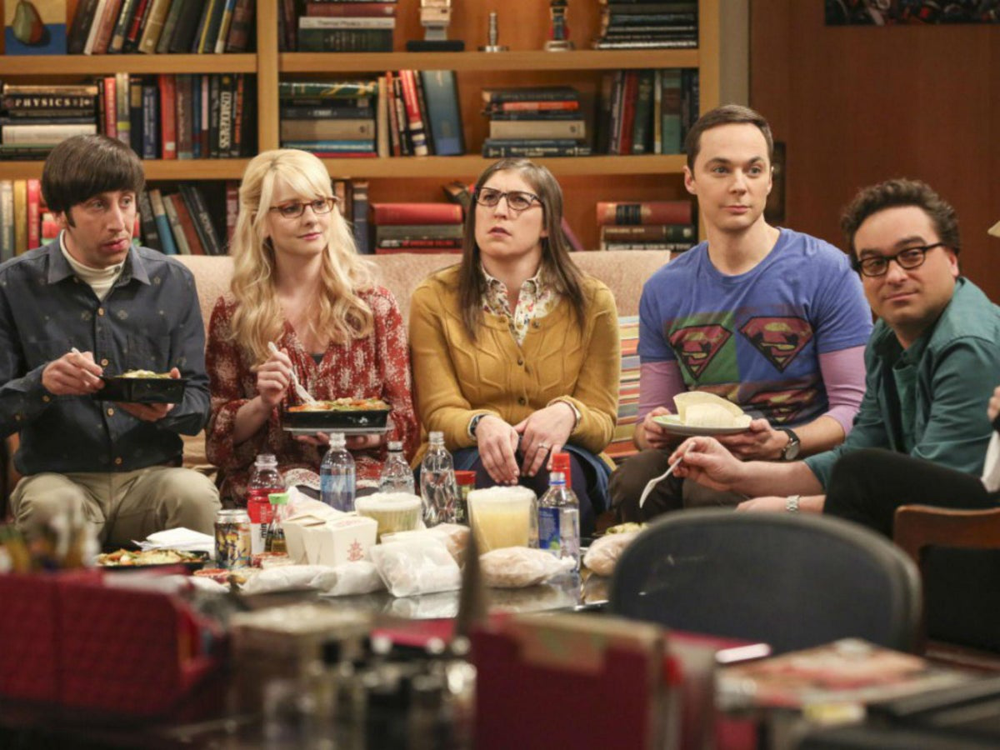

time: 5.32 s (started: 2021-07-18 18:14:11 +02:00)


In [5]:
from src.few_shot_face_classification import recognise

im_path = Path.cwd() / 'demo/raw/group20.jpeg'
classes = recognise(
    path=im_path,
    labeled_f=DATA_LABELED,
)
print(f"Predicted classes: {classes}")
im = load_single(im_path)
im

### 1.3. Add irrelevant information

Sometimes, several images are included of people **not** of interest. It is possible to remove these false positives from the export by adding faces to the labeled dataset which the algorithm has to ignore. If you have several images of people (can be several people in one single image) that should not get recognised, you can add them as qualified "noise" to the labeled folder (`labeled_f`) to reduce the number of false positives made by the algorithm.

The algorithm will extract the faces present in the provided image, and assign them all to the `None` class. Newly observed faces (during inference) that match with any face from this none-class are ignored automatically. In other words, the algorithm keeps operating as it did before. However, if the *best face-match* happens to be with a face from this none-class, the algorithm identifies this match as *not of interest* and ignores it. However, if another face in the image still matches one of the people of interest, this match still proceeds.

**Note: running the same image twice will cause duplicates. This shouldn't affect the algorithm too much, however it can slow down inference time when done too much.**

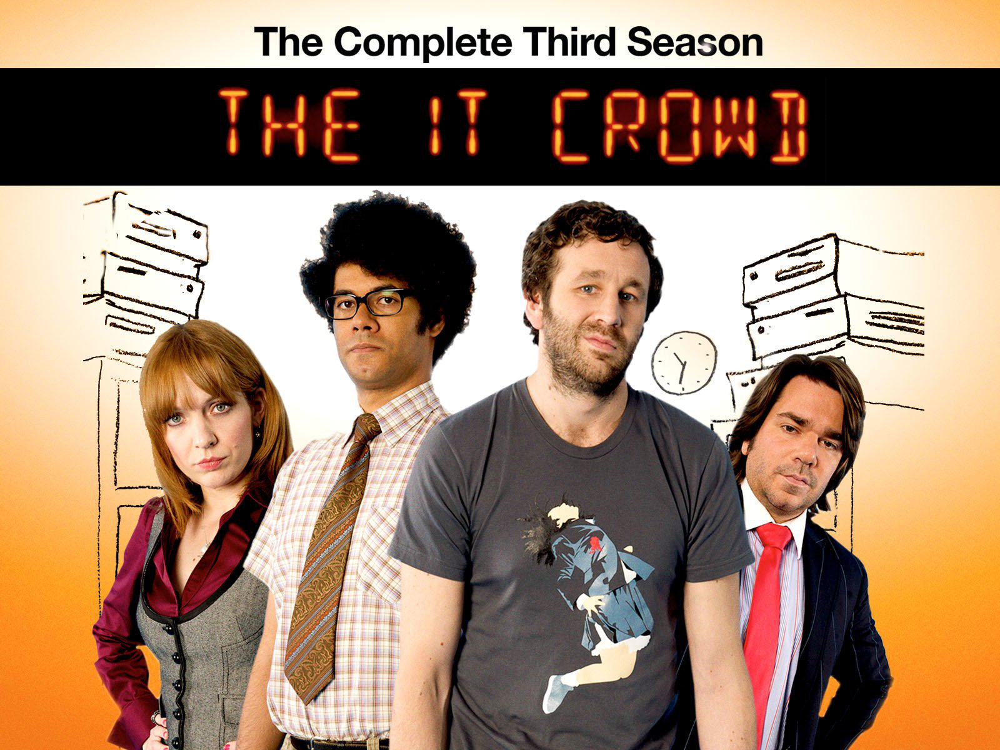

time: 1.86 s (started: 2021-07-18 18:15:00 +02:00)


In [8]:
from src.few_shot_face_classification import add_none

im_path = Path.cwd() / 'demo/raw/it_crowd.jpeg'
add_none(
    path=im_path,
    labeled_f=DATA_LABELED,
)
load_single(im_path)




## 2. Step by step

This section displays how the algorithm, or more specifically the `detect_and_export` function, operates step by step.

### 2.1. Data

Before kicking off the algorithm, we'll have a look at the images present in the `DATA_RAW` folder.

Found a total of 28 images


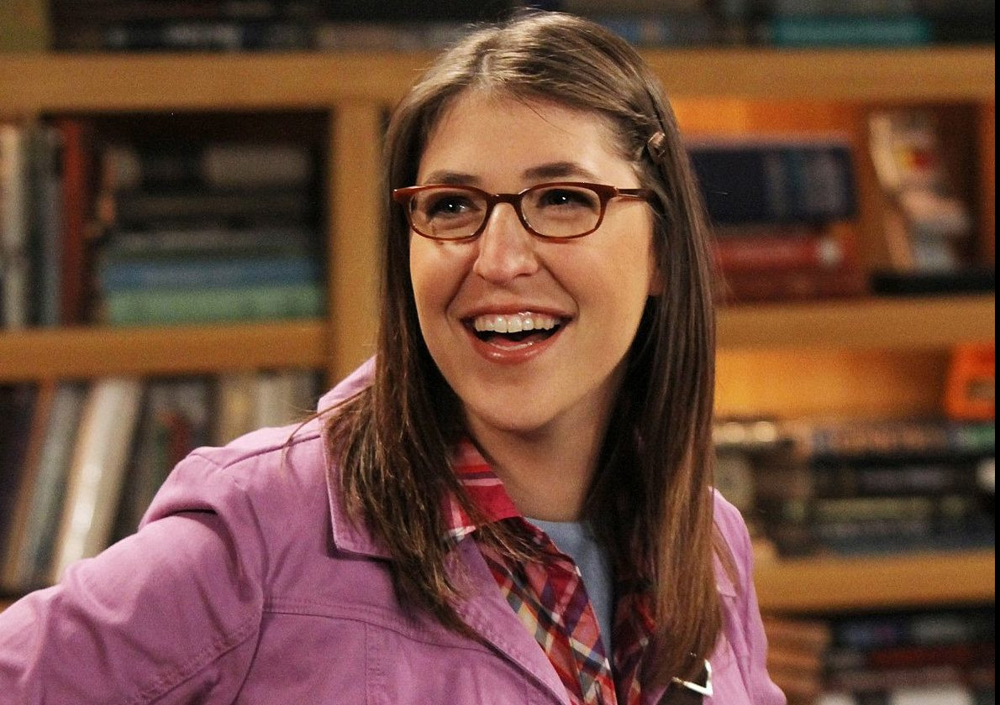

time: 550 ms (started: 2021-07-18 18:15:49 +02:00)


In [9]:
# Get the number of images in the folder
paths = get_im_paths(DATA_RAW)
print(f"Found a total of {len(paths)} images")

# Show an example image
load_single(paths[0])

### 2.2. Validate Labels

To ensure good *face-representations* are made using the images found in the `DATA_LABELED` folder, we'll validate their quality. This validation checks if exactly one face is recognised in the image (to prevent any confusion) and if this extracted face can be embedded. Face extraction is done using the `MTCNN` network, where the `VGGFace2` network is responsible to create the *face-representations* (embeddings).

Note that there is a duality within the code, since there are actually two `validation` functions:
- The one shown below (`few_shot_face_classification/embed/validate_face`) returns a boolean whether or not a face is recognised, as described above.
- The other function (`few_shot_face_classification/validate_labels`) utilises the previous function and operates accordingly. As a parameter, one can choose to ignore but warn about conflicing labels, remove them, or simply let the algorithm crach. The latter is done since the algorithm cannot proceed properly when one of the labels is broken. 

In [10]:
# Load in the networks used for validation (instead of loading new models during validation)
mtcnn, vggface2 = get_networks()

time: 357 ms (started: 2021-07-18 18:15:58 +02:00)


In [11]:
labeled = get_im_paths(DATA_LABELED)
print(f"Total of {len(labeled)} labeled faces")

for path in labeled:
    im = load_single(path)
    if not validate_face(im, val_single=True, mtcnn=mtcnn, vggface2=vggface2):
        raise Exception

Total of 14 labeled faces
time: 1.45 s (started: 2021-07-18 18:16:00 +02:00)


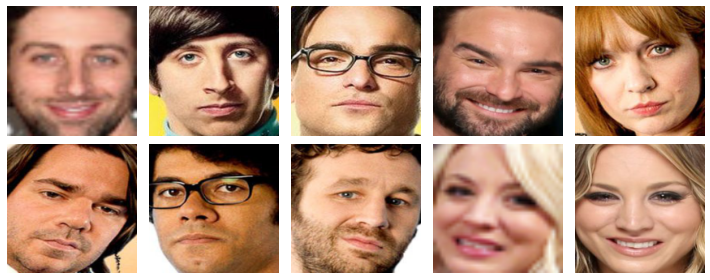

time: 449 ms (started: 2021-07-18 18:16:01 +02:00)


In [12]:
# Show several examples
plt.figure(figsize=(10,4))
for i, path in enumerate(labeled[:10]):
    plt.subplot(2,5,i+1)
    im = plt.imread(path)
    plt.imshow(im)
    plt.axis('off')
plt.tight_layout()
plt.show()

### 2.3. Embed

Create embeddings (*face-representations*) for each of the detected and extracted faces. For this, we'll use the VGGFace2 network. To denote the similarity between two different faces, we'll use the Euclidean distance. This distance reflects how different two faces are (or their representations), where a distance of `0` denotes identical faces, and a growing distance denotes a growing difference between the faces. We noted that faces that have a distance greater than `1` are likely not related.

In [13]:
# Embed the labeled data
labeled_paths, labeled_embs = embed_folder(DATA_LABELED)

Processing: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.38s/it]

time: 3.63 s (started: 2021-07-18 18:16:07 +02:00)


In [14]:
# Use seaborn to show the distance matrix
!pip install seaborn

time: 1.17 s (started: 2021-07-18 18:16:11 +02:00)


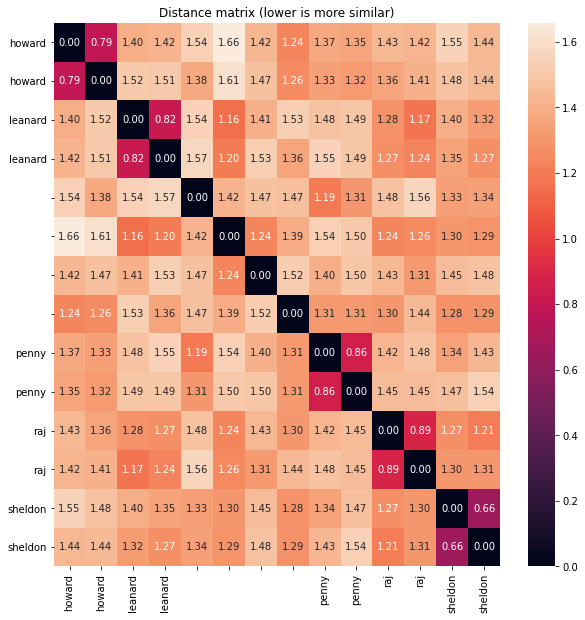

time: 1.25 s (started: 2021-07-18 18:16:12 +02:00)


In [15]:
import seaborn as sns
from sklearn.metrics.pairwise import euclidean_distances

# Display the similarity matrix (missing ticks are from the None-classes)
plt.figure(figsize=(10,10))
plt.title("Distance matrix (lower is more similar)")
dist = euclidean_distances(labeled_embs)
sns.heatmap(dist, annot=True, fmt='.2f')
plt.xticks(
    [i + .5 for i in range(len(labeled_paths))],
    [get_class(p) for p in labeled_paths],
    rotation=90,
)
plt.yticks(
    [i + .5 for i in range(len(labeled_paths))],
    [get_class(p) for p in labeled_paths],
    rotation=0,
)
plt.show()

In [16]:
# Embed the raw data
paths,embs = embed_folder(DATA_RAW)

Processing: 100%|█████████████████████████████████████████████████████████████████| 1/1 [00:22<00:00, 22.02s/it]

time: 22.3 s (started: 2021-07-18 18:16:13 +02:00)


### 2.4. Classification

Together with the labeled data (the *remembered face-representations*) and the embedded raw data, we can match the newly observed faces that were part of the raw dataset to the labeled faces. This is done by comparing each new face to all the remembered faces and check it's similarity:
- If no face is *similar enough* (e.g. the distance between the new face and all labeled faces is greater than the predefined distance threshold), no class is assigned to it.
- If the face is similar to one of the remembered faces, the corresponding class is attached to the image from which the new face originates. However, if this matching remembered face is part of the none-class, it is ignored as well. Each face is only matched to one remembered face at most, this being the most similar one.

Results of this export are written to the export folder (`DATA_WRITE`) in corresponding subfolder. E.g. the class `sheldon` is written to `DATA_WRITE/sheldon/`.

In [17]:
# Export all images to the corresponding classes
export(
    paths=paths,
    embs=embs,
    labeled_paths=labeled_paths,
    labeled_embs=labeled_embs,
    write_f=DATA_WRITE,
)

time: 44.7 ms (started: 2021-07-18 18:16:36 +02:00)


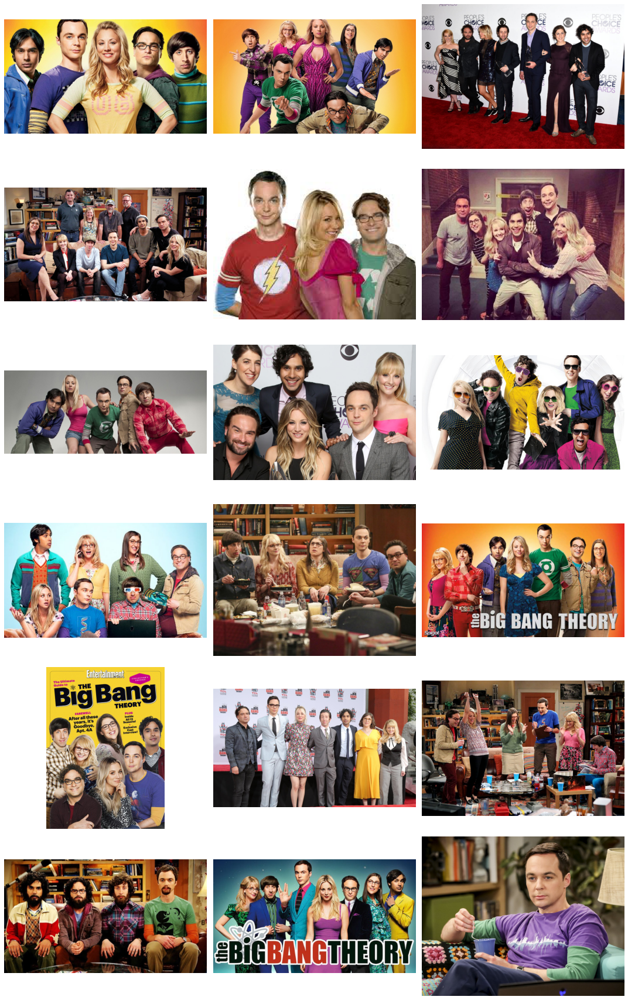

time: 2.57 s (started: 2021-07-18 18:16:36 +02:00)


In [18]:
# Visualise all images of a single class
cls = 'sheldon'

# Extract all images from that class
cls_paths = get_im_paths(DATA_WRITE / cls)

plt.figure(figsize=(5*3,4*(len(cls_paths)//3+1)))
for i, im_path in enumerate(cls_paths):
    plt.subplot(len(cls_paths)//3+1,3,i+1)
    im = plt.imread(im_path)
    plt.imshow(im)
    plt.axis('off')
plt.tight_layout()